# QBIO 577 Fall 2022
# Systems biology: modeling noise

In [1]:
## Set up environment (if you need to install packages, run: using Pkg; Pkg.add("Plots"))
using ModelingToolkit, DifferentialEquations, Catalyst, Latexify
using Plots, Makie, CairoMakie
import SymPy

## Colors used for plots
cc = ["#0072BD" "#D95319" "#EDB120" ]; 


#### Let's define a model called ecomodel using `Catalyst.jl` where
🐬 $\xrightarrow{\textrm{eat}}$ 🐸 $\xrightarrow{\textrm{eat}}$ 🐜  

In [2]:
ecomodel = @reaction_network begin
    α₁*(1 - 0.01*🐜 - 0.05*🐸), 🐜 --> 2🐜
    α₂*(1 - 0.1*🐬), 🐜 --> 🐸
    δ₁, 🐜 --> ∅
    δ₂, 🐸 --> 🐬
    δ₃, 🐬 --> ∅
    end α₁ α₂ δ₁ δ₂ δ₃


Model ##ReactionSystem#312
States (3):
  🐜(t)
  🐸(t)
  🐬(t)
Parameters (5):
  α₁
  α₂
  δ₁
  δ₂
  δ₃

## Scenario 1: ODE model

In [3]:
odesys = convert(ODESystem, ecomodel)


Model ##ReactionSystem#312 with 3 equations
States (3):
  🐜(t)
  🐸(t)
  🐬(t)
Parameters (5):
  α₁
  α₂
  δ₁
  δ₂
  δ₃

To simulate the ODE model derived from this reaction network, define the necessary inputs (parameters, initial conditions, time span), convert the reaction network into an ODEProblem and simulate directly using `DifferentialEquations.jl`

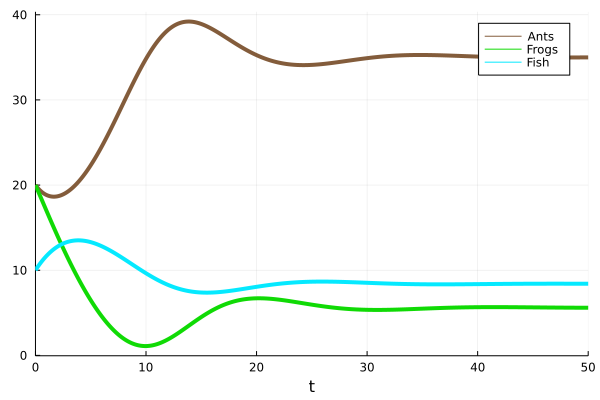

In [13]:
## Colors for plotting
cc = ["#835C3B" "#10DA05" "#05E9FF"]

## Parameters [α₁ α₂ δ₁ δ₂ δ₃]
p = (0.2, 0.15, 0.05, 0.15, 0.1)

## Initial conditions
u₀ = [20., 20., 10.]

## time span for simulation 
tspan = (0., 50.)

## create the ODE system
odeprob = ODEProblem(ecomodel, u₀, tspan, p)

sol = solve(odeprob, Tsit5())
Plots.plot(sol, lw=4, lc=cc, labels=["Ants" "Frogs" "Fish"])

## Scenario 2: Stochastic differential equation (SDE) model

To simulate a stochastic differential equation (SDE) model from the same reaction network, using the same inputs as for the ODE model, we can directly declare the model with no new definitions. NB we assume Brownian noise in this example, other noise models can be substituted (e.g. by modifying the $g$ of the SDE)

$$
 du = f(u,p,t)dt + g(u,p,t)dW.
$$

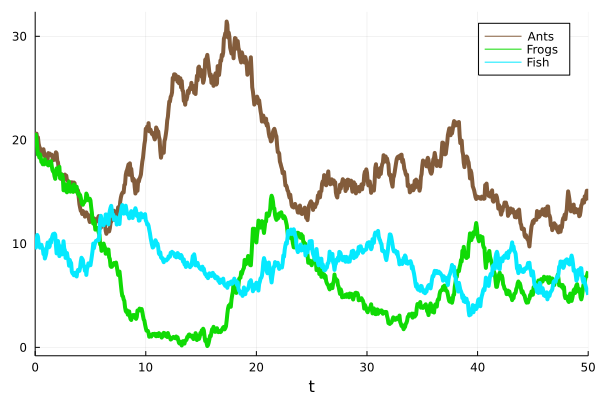

In [14]:
sdeprob = SDEProblem(ecomodel, u₀, tspan, p)

dt = 1//2^(4)
sol = solve(sdeprob, EM(), dt=dt)
Plots.plot(sol, lw=4, lc=cc, labels=["Ants" "Frogs" "Fish"])


oops! Negative frogs... how should we deal with that?


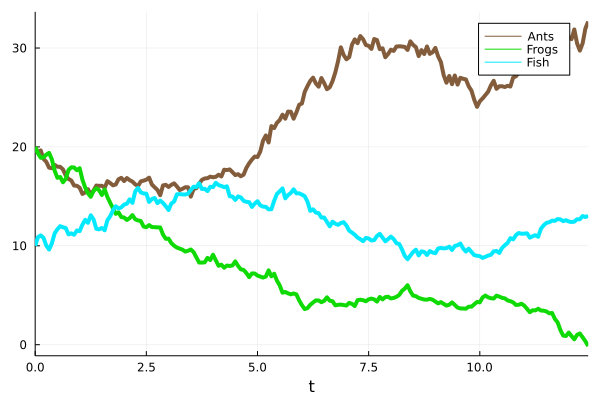

In [22]:
## define conditions for simulation to end if species go negative 
function condition(u,t,integrator) 
  u[1] < 0.0 || u[2] < 0.0 || u[3] < 0.0
end
floor_event = DiscreteCallback(condition, terminate!)

sol = solve(sdeprob, EM(), dt=dt, callback=floor_event)

Plots.plot(sol, lw=4, lc=cc, labels=["Ants" "Frogs" "Fish"])


## Scenario 3: Stochastic jump process (Gillespie's method)

To perform simulations of the discrete-time stochastic process associated with this reaction network, we can define a discrete problem and simulate it using SSA (Stochastic Simulation Algorithm), also known as the direct Gillespie algorithm.

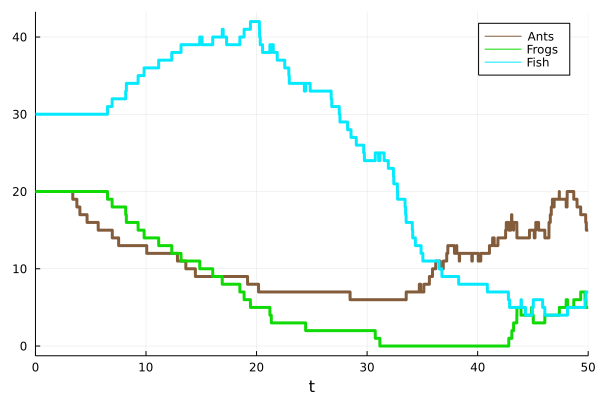

In [31]:

tspan = (0., 50.)
ds_discrete = DiscreteProblem(ecomodel, [20,20,30], tspan, p)
jump_ds = JumpProblem(ecomodel, ds_discrete, Direct())

sol = solve(jump_ds, SSAStepper())
Plots.plot(sol, lw=3, lc=cc, labels=["Ants" "Frogs" "Fish"])


# Second model example: the repressilator 

See [here](http://be150.caltech.edu/2020/content/lessons/08_repressilator.html]) for nice intro to the model. We will study the dynamics of the repressilator using either ODEs or a jump stochastic process simulated by Gillespie's method.


In [32]:
repressilator = @reaction_network Repressilator begin
    hillr(P₃,α,K,n), ∅ --> m₁
    hillr(P₁,α,K,n), ∅ --> m₂
    hillr(P₂,α,K,n), ∅ --> m₃
    (δ,γ), m₁ <--> ∅
    (δ,γ), m₂ <--> ∅
    (δ,γ), m₃ <--> ∅
    β, m₁ --> m₁ + P₁
    β, m₂ --> m₂ + P₂
    β, m₃ --> m₃ + P₃
    μ, P₁ --> ∅
    μ, P₂ --> ∅
    μ, P₃ --> ∅
end α K n δ γ β μ


Model Repressilator
States (6):
  m₁(t)
  m₂(t)
  m₃(t)
  P₁(t)
  P₂(t)
  P₃(t)
Parameters (7):
  α
  K
  n
  δ
  γ
  β
⋮

In [33]:
latexify(repressilator, starred=true)


"\\begin{align*}\n\\require{mhchem}\n\\ce{ \\varnothing &->[\$\\frac{\\alpha K^{n}}{K^{n} + P_3^{n}}\$] m_1}\\\\\n\\ce{ \\varnothing &->[\$\\frac{\\alpha K^{n}}{K^{n} + P_1^{n}}\$] m_2}\\\\\n\\ce{ \\varnothing &->[\$\\frac{\\alpha K^{n}}{K^{n} + P_2^{n}}\$] m_3}\\\\\n\\ce{ m_1 &<=>[\$\\delta\$][\$\\gamma\$] \\" ⋯ 62 bytes ⋯ "\n\\ce{ m_3 &<=>[\$\\delta\$][\$\\gamma\$] \\varnothing}\\\\\n\\ce{ m_1 &->[\$\\beta\$] m_1 + P_1}\\\\\n\\ce{ m_2 &->[\$\\beta\$] m_2 + P_2}\\\\\n\\ce{ m_3 &->[\$\\beta\$] m_3 + P_3}\\\\\n\\ce{ P_1 &->[\$\\mu\$] \\varnothing}\\\\\n\\ce{ P_2 &->[\$\\mu\$] \\varnothing}\\\\\n\\ce{ P_3 &->[\$\\mu\$] \\varnothing}\n\\end{align*}\n"

In [34]:
odesys = convert(ODESystem, repressilator)
latexify(odesys)

"\\begin{align}\n\\frac{dm_1(t)}{dt} =& \\gamma - \\delta \\mathrm{m_1}\\left( t \\right) + \\mathrm{hillr}\\left( \\mathrm{P_3}\\left( t \\right), \\alpha, K, n \\right) \\\\\n\\frac{dm_2(t)}{dt} =& \\gamma - \\delta \\mathrm{m_2}\\left( t \\right) + \\mathrm{hillr}\\left( \\mathrm{P_1}\\left( t \\r" ⋯ 199 bytes ⋯ "eta \\mathrm{m_1}\\left( t \\right) - \\mu \\mathrm{P_1}\\left( t \\right) \\\\\n\\frac{dP_2(t)}{dt} =& \\beta \\mathrm{m_2}\\left( t \\right) - \\mu \\mathrm{P_2}\\left( t \\right) \\\\\n\\frac{dP_3(t)}{dt} =& \\beta \\mathrm{m_3}\\left( t \\right) - \\mu \\mathrm{P_3}\\left( t \\right)\n\\end{align}\n"

In [35]:
@parameters  α K n δ γ β μ
@variables t m₁(t) m₂(t) m₃(t) P₁(t) P₂(t) P₃(t)

pmap  = (α => 0.5, K => 10, n => 2, δ => 5e-2, γ => 5e-3, β => 0.1, μ => 0.01)
u₀map = [m₁ => 0., m₂ => 0., m₃ => 0., P₁ => 20., P₂ => 0., P₃ => 0.]
tspan = (0., 1000.)


odeprob = ODEProblem(repressilator, u₀map, tspan, pmap)

sol = solve(odeprob, saveat=0.01);
Plots.plot(sol) 


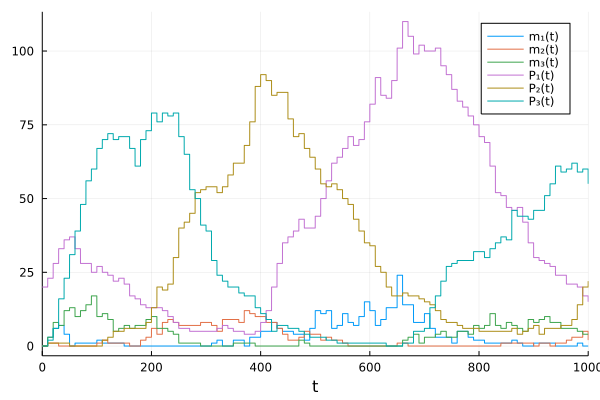

In [36]:
# redefine the initial condition to be integer valued
u₀map = [:m₁ => 0, :m₂ => 0, :m₃ => 0, :P₁ => 20, :P₂ => 0, :P₃ => 0]

# next we create a discrete problem to encode that our species are integer valued:
dprob = DiscreteProblem(repressilator, u₀map, tspan, pmap)

# now, we create a JumpProblem, and specify Gillespie's Direct Method as the solver:
jprob = JumpProblem(repressilator, dprob, Direct(), save_positions=(false,false))

# now, let's solve and plot the jump process:
sol = solve(jprob, SSAStepper(), saveat=10.)
Plots.plot(sol)